## Download Kaggle Dataset

In [0]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [2]:
!kaggle datasets download -d hmnshu/formatteddata
!unzip formatteddata.zip > /dev/null

100% 251M/251M [00:05<00:00, 37.1MB/s]
100% 251M/251M [00:05<00:00, 46.8MB/s]


In [3]:
!kaggle competitions download -c understanding_cloud_organization
!mkdir train_images
!unzip train_images.zip -d train_images > /dev/null
!ls /content/

100% 3.43G/3.44G [00:26<00:00, 97.3MB/s]
100% 3.44G/3.44G [00:26<00:00, 137MB/s] 
100% 2.30G/2.30G [00:17<00:00, 171MB/s]
100% 2.30G/2.30G [00:17<00:00, 140MB/s]
 76% 41.0M/54.2M [00:00<00:00, 32.7MB/s]
100% 54.2M/54.2M [00:00<00:00, 101MB/s] 
  0% 0.00/321k [00:00<?, ?B/s]
100% 321k/321k [00:00<00:00, 107MB/s]
df_test_json_file.json	 kaggle.json		train.csv.zip
df_train_json_file.json  sample_data		train_df_new.csv
formatteddata.zip	 sample_submission.csv	train_images
json_file1.json		 test_images.zip	train_images.zip


# Install detectron2

In [4]:
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git
import torch, torchvision
torch.__version__

Requirement already up-to-date: torch in /usr/local/lib/python3.6/dist-packages (1.3.1+cu100)
Requirement already up-to-date: torchvision in /usr/local/lib/python3.6/dist-packages (0.4.2+cu100)
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-vvd88o2c
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-vvd88o2c
     |████████████████████████████████| 266kB 4.1MB/s 
  Created wheel for fvcore: filename=fvcore-0.1-cp36-none-any.whl size=47493 sha256=c0fe4d9531e96f6ddd15a33a8d96896b205b61c02cf97707156583e324c1ff67
  Stored in directory: /tmp/pip-ephem-wheel-cache-as02razz/wheels/48/53/79/3c6485543a4455a0006f5db590ab9957622b6227011941de06
  Created wheel for pyyaml: filename=PyYAML-5.1.2-cp36-cp36m-linux_x86_64.whl size=44104 sha256=c1308d45ccc1f00f720bc2317eb735700f48049d7c89791765e66cfa502f6654
  Stored in directory: /root/.cache/pip/wheels/d9/45/dd/65f0b38450c47cf7e5312883deb97d065e030c5cca0a365030
Successfully b

'1.3.1+cu100'

In [5]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 5, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 1334 (delta 0), reused 1 (delta 0), pack-reused 1329
Receiving objects: 100% (1334/1334), 1.60 MiB | 1.52 MiB/s, done.
Resolving deltas: 100% (796/796), done.
Obtaining file:///content/detectron2_repo
     |████████████████████████████████| 2.1MB 2.8MB/s 
     |████████████████████████████████| 61kB 10.8MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 4.3.0
    Uninstalling Pillow-4.3.0:
      Successfully uninstalled Pillow-4.3.0
  Found existing installation: tqdm 4.28.1
    Uninstalling tqdm-4.28.1:
      Successfully uninstalled tqdm-4.28.1
  Running setup.py develop for detectron2


In [0]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Train on a custom dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

which only has 4 classes: 'Fish', 'Flower', 'Gravel', 'Sugar'
We'll train a segmentation model from an existing model pre-trained on the COCO dataset, available in detectron2's model zoo.

Note that the COCO dataset does not have the'Fish', 'Flower', 'Gravel', 'Sugar' categories.

Register the cloud dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).


In [0]:
!ls

In [0]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("clouds_train", {}, "/content/df_train_json_file.json", "/content/train_images/")

In [3]:
%%time
df_train_metadata = MetadataCatalog.get("clouds_train")
dataset_dicts = DatasetCatalog.get("clouds_train")
register_coco_instances("clouds_test", {}, "/content/df_test_json_file.json", "/content/train_images/")

[11/17 07:19:19 d2.data.datasets.coco]: Loading /content/df_train_json_file.json takes 35.12 seconds.
WARNING [11/17 07:19:19 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/17 07:19:19 d2.data.datasets.coco]: Loaded 5286 images in COCO format from /content/df_train_json_file.json
CPU times: user 29.2 s, sys: 2.85 s, total: 32 s
Wall time: 35.4 s


To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:



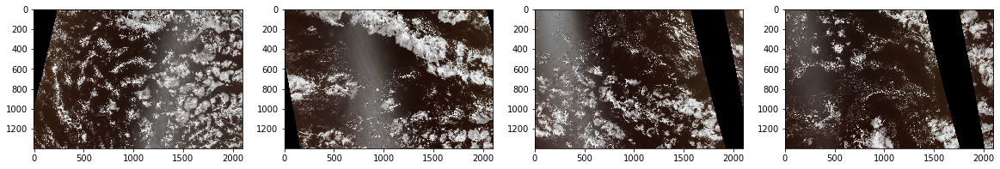

In [4]:
top = dataset_dicts[:4]
import pdb
fig = plt.figure(figsize=(20, 20))
for index, d in enumerate(top):
  ax = fig.add_subplot(1, 4, index+1)
  img = cv2.imread(d["file_name"]) 
  #print(d["file_name"])
  plt.imshow(img)

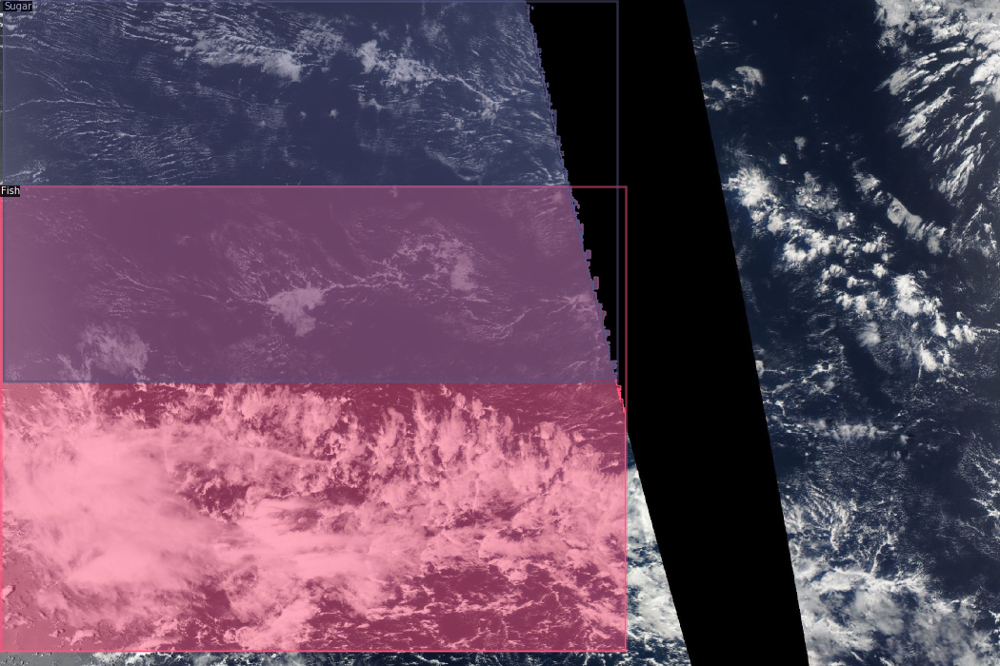

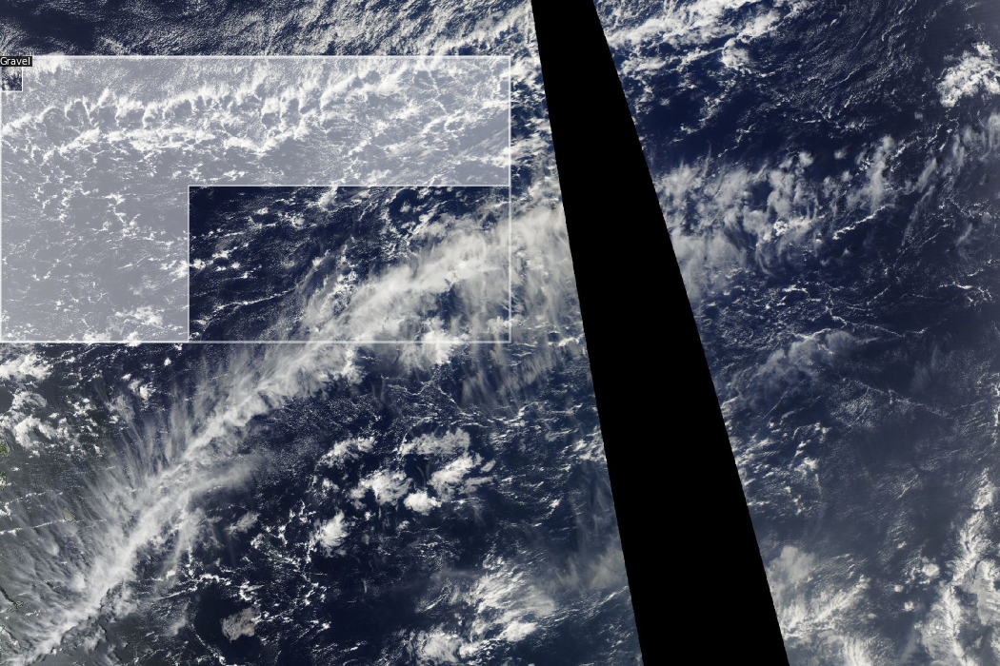

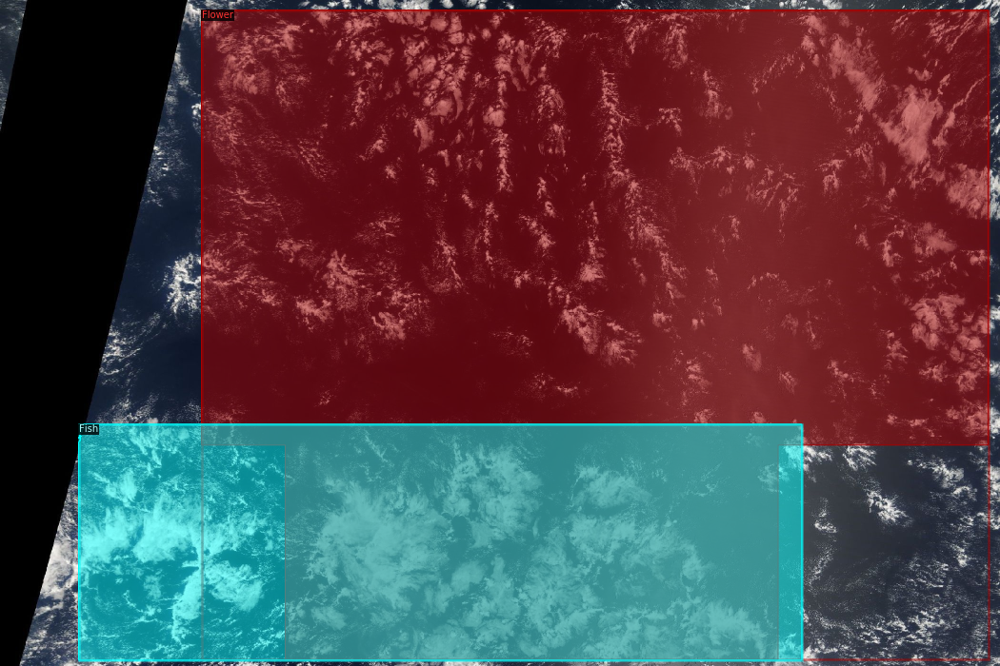

In [5]:
import random

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=df_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

Now, let's fine-tune a coco-pretrained R50-FPN Mask R-CNN model on the fruits_nuts dataset. It takes ~6 minutes to train 300 iterations on Colab's K80 GPU.


In [6]:
%%time
#https://github.com/facebookresearch/detectron2/blob/master/tools/plain_train_net.py
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("clouds_train",)
cfg.DATASETS.TEST = ("clouds_test", )
#cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 8
cfg.SOLVER.BASE_LR = 0.02
cfg.SOLVER.MAX_ITER = 500    # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 224   # faster, and good enough for this dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4  # 4 classes

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

WARNING [11/17 07:19:41 d2.config.compat]: Config './detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml' has no VERSION. Assuming it to be compatible with latest v2.
[11/17 07:19:47 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
    

model_final_f10217.pkl: 178MB [00:15, 11.6MB/s]                           
'roi_heads.box_predictor.cls_score.weight' has shape (81, 1024) in the checkpoint but (5, 1024) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (5,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 1024) in the checkpoint but (16, 1024) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (16,) in the model! Skipped.
'roi_heads.mask_head.predictor.weight' has shape (80, 256, 1, 1) in the checkpoint but (4, 256, 1, 1) in the model! Skipped.
'roi_heads.mask_head.predictor.bias' has shape (80,) in the checkpoint but (4,) in the model! Skipped.


[11/17 07:20:45 d2.engine.train_loop]: Starting training from iteration 0
[11/17 07:21:23 d2.utils.events]: eta: 0:15:05  iter: 19  total_loss: 2.039  loss_cls: 0.738  loss_box_reg: 0.435  loss_mask: 0.675  loss_rpn_cls: 0.090  loss_rpn_loc: 0.042  time: 1.9143  data_time: 0.0779  lr: 0.000400  max_mem: 8601M
[11/17 07:22:03 d2.utils.events]: eta: 0:15:04  iter: 39  total_loss: 1.448  loss_cls: 0.412  loss_box_reg: 0.404  loss_mask: 0.576  loss_rpn_cls: 0.017  loss_rpn_loc: 0.037  time: 1.9755  data_time: 0.0791  lr: 0.000799  max_mem: 8601M
[11/17 07:22:41 d2.utils.events]: eta: 0:13:56  iter: 59  total_loss: 1.362  loss_cls: 0.369  loss_box_reg: 0.413  loss_mask: 0.511  loss_rpn_cls: 0.016  loss_rpn_loc: 0.032  time: 1.9460  data_time: 0.0761  lr: 0.001199  max_mem: 8601M
[11/17 07:23:18 d2.utils.events]: eta: 0:13:16  iter: 79  total_loss: 1.372  loss_cls: 0.366  loss_box_reg: 0.422  loss_mask: 0.518  loss_rpn_cls: 0.019  loss_rpn_loc: 0.034  time: 1.9240  data_time: 0.0756  lr: 0.0

Now, we perform inference with the trained model on the fruits_nuts dataset. First, let's create a predictor using the model we just trained:



In [7]:
%%time
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)

CPU times: user 630 ms, sys: 147 ms, total: 777 ms
Wall time: 775 ms


In [8]:
df_test_metadata = MetadataCatalog.get("clouds_test")
dataset_test_dicts = DatasetCatalog.get("clouds_test")

[11/17 07:36:45 d2.data.datasets.coco]: Loading /content/df_test_json_file.json takes 4.84 seconds.
WARNING [11/17 07:36:45 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/17 07:36:45 d2.data.datasets.coco]: Loaded 1585 images in COCO format from /content/df_test_json_file.json


Then, we randomly select several samples to visualize the prediction results.

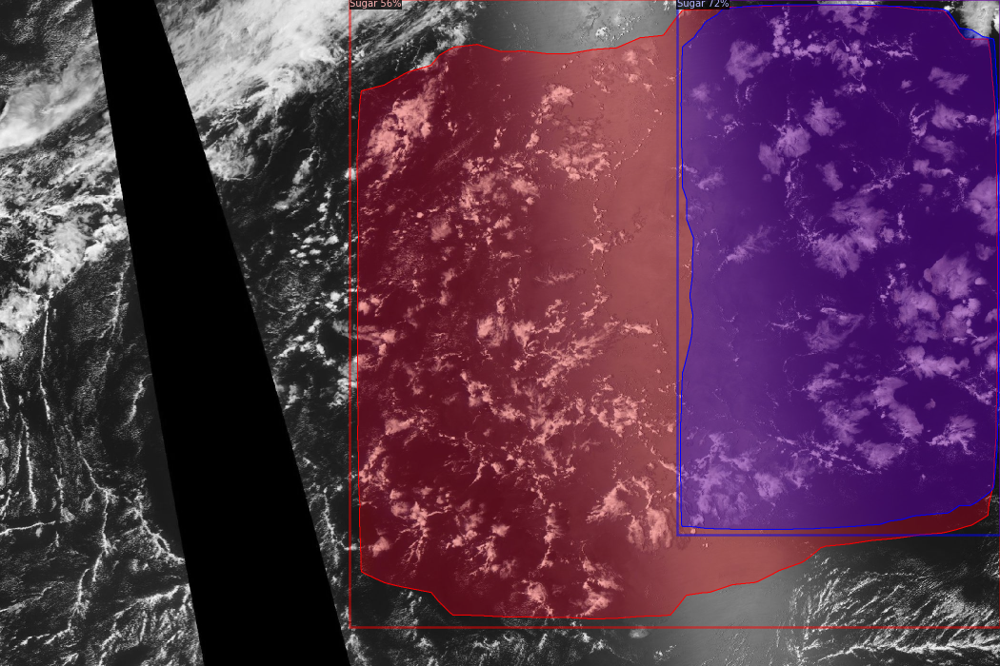

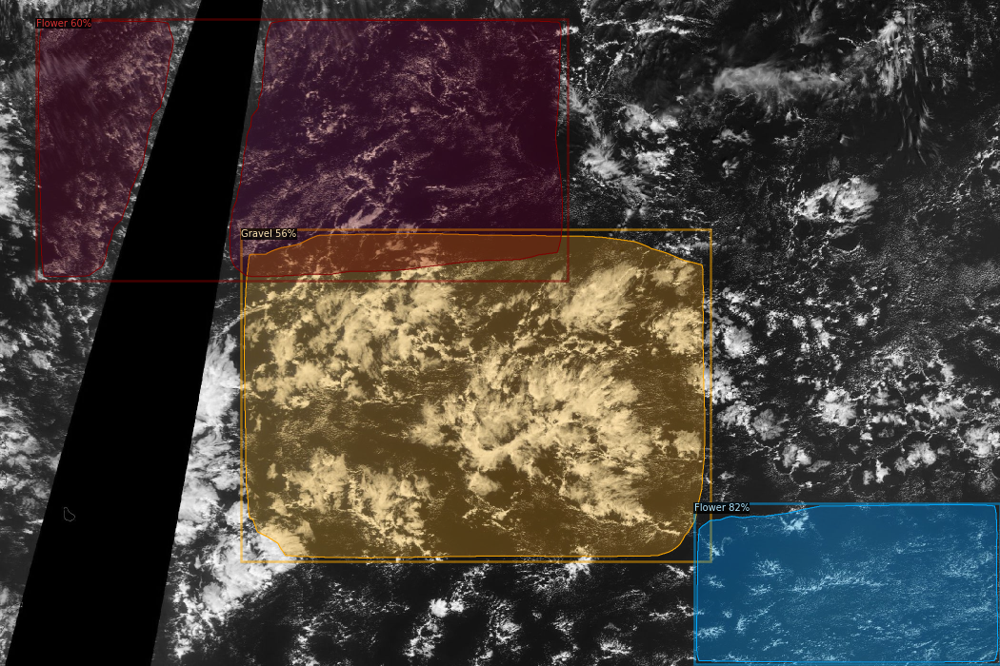

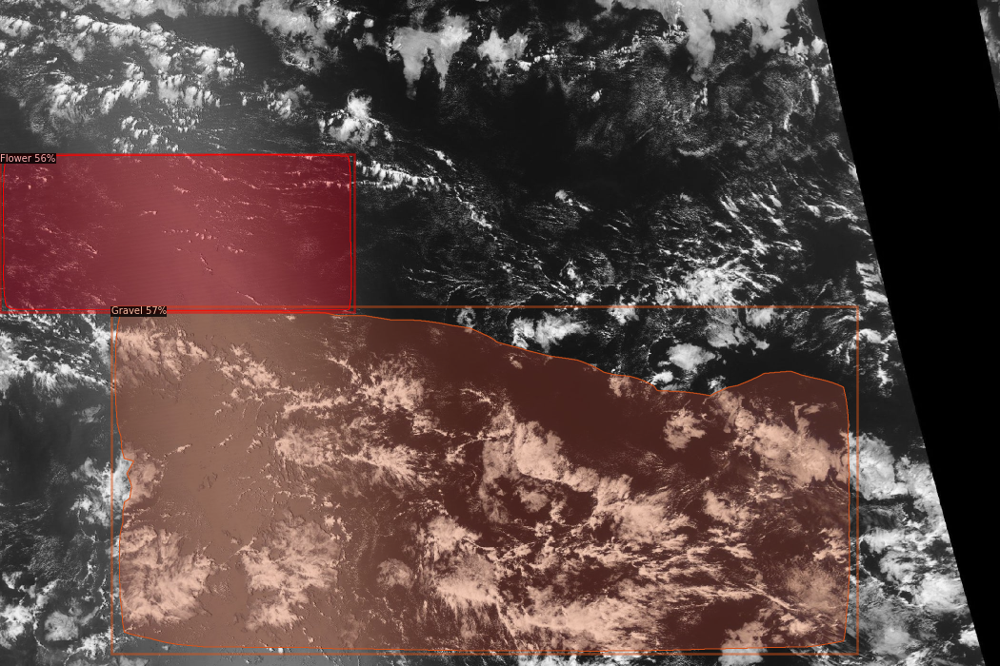

CPU times: user 4.93 s, sys: 108 ms, total: 5.03 s
Wall time: 4.8 s


In [9]:
%%time
from detectron2.utils.visualizer import ColorMode
import random

for d in random.sample(dataset_test_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=df_test_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

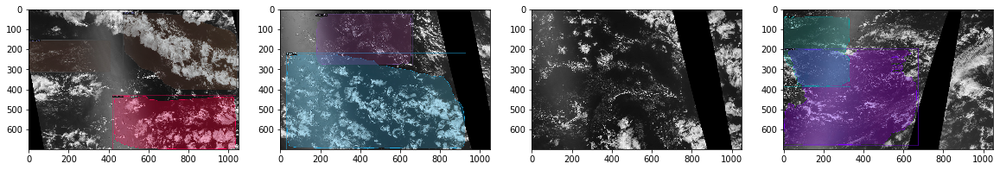

In [15]:
from detectron2.utils.visualizer import ColorMode

fig = plt.figure(figsize=(20, 20))
top = dataset_test_dicts[:4]
for index, d in enumerate(top):    
    ax = fig.add_subplot(1, 4, index+1)
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=df_test_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.imshow(v.get_image()[:, :, ::-1])

## Benchmark inference speed

In [11]:
import time
times = []
for i in range(20):
    start_time = time.time()
    outputs = predictor(im)
    delta = time.time() - start_time
    times.append(delta)
mean_delta = np.array(times).mean()
fps = 1 / mean_delta
print("Average(sec):{:.2f},fps:{:.2f}".format(mean_delta, fps))

Average(sec):0.11,fps:8.71


![alt text](./cloud.PNG)

In [13]:
#!kill 790
# Look at training curves in tensorboard:
#%load_ext tensorboard
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 944), started 0:08:03 ago. (Use '!kill 944' to kill it.)